# Homework 01

### Importing the libraries

In [194]:
import pandas as pd
import numpy as np
import seaborn as sb
%matplotlib inline
import matplotlib.pyplot as plt

In [195]:
cd D:\Academics\FML

D:\Academics\FML


### Importing Data

Here we import the data using pandas library and then select 12 parameters for our input matrix X

In [196]:
data = pd.read_csv("hour.csv")

In [207]:
X = data[[ 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed','registered']]
X.shape

(17379, 12)

### Correlation matrix and Heat Map

Here we compute the correlation matrix of the input data and plot its corresponding heat map. 
The heat map shows the correlation of the parameters with respect to each other.


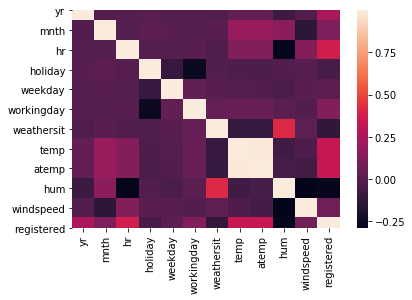

In [198]:
a = X-X.mean()
b = a.T@a
c = b/17379
Std_X = X.std()
d = np.multiply.outer(Std_X.to_numpy(),Std_X.to_numpy())
e = c/d
sb.heatmap(e)

### Observations
Season : As one can observe in the matrix, season is highly correlated with 

In [199]:

"""
b = sb.jointplot(x="yr", y="cnt", data=X)
c = sb.jointplot(x="mnth", y="cnt", data=X)
d = sb.jointplot(x="hr", y="cnt", data=X)
e = sb.jointplot(x="holiday", y="cnt", data=X)
f = sb.jointplot(x="weekday", y="cnt", data=X)
g = sb.jointplot(x="workingday", y="cnt", data=X)
h = sb.jointplot(x="weathersit", y="cnt", data=X)
i = sb.jointplot(x="temp", y="cnt", data=X)
j = sb.jointplot(x="atemp", y="cnt", data=X)
k = sb.jointplot(x="hum", y="cnt", data=X)
l = sb.jointplot(x="windspeed", y="cnt", data=X)
m = sb.jointplot(x="casual", y="cnt", data=X)
n = sb.jointplot(x="registered", y="cnt", data=X)
o = sb.jointplot(x="windspeed", y="cnt", data=X)

t = data["cnt"].to_numpy()

"""


'\nb = sb.jointplot(x="yr", y="cnt", data=X)\nc = sb.jointplot(x="mnth", y="cnt", data=X)\nd = sb.jointplot(x="hr", y="cnt", data=X)\ne = sb.jointplot(x="holiday", y="cnt", data=X)\nf = sb.jointplot(x="weekday", y="cnt", data=X)\ng = sb.jointplot(x="workingday", y="cnt", data=X)\nh = sb.jointplot(x="weathersit", y="cnt", data=X)\ni = sb.jointplot(x="temp", y="cnt", data=X)\nj = sb.jointplot(x="atemp", y="cnt", data=X)\nk = sb.jointplot(x="hum", y="cnt", data=X)\nl = sb.jointplot(x="windspeed", y="cnt", data=X)\nm = sb.jointplot(x="casual", y="cnt", data=X)\nn = sb.jointplot(x="registered", y="cnt", data=X)\no = sb.jointplot(x="windspeed", y="cnt", data=X)\n\nt = data["cnt"].to_numpy()\n\n'

In [200]:
from sklearn.model_selection import train_test_split
X_training, X_test, t_train, t_test = train_test_split(X,t,test_size= 0.6, random_state = 101)
X_training.shape
X_test.shape

(10428, 12)

In [201]:
w = list(np.linalg.inv(X_training.T@X_training)@X_training.T@t_train)
w

[3.647510504362126,
 -0.030008499711775743,
 0.6230888928550212,
 -11.370044342328018,
 1.5447991953457896,
 -38.238577939486674,
 3.192999490764925,
 45.23171654196936,
 53.58837829110563,
 -41.07189512594932,
 16.541855759181036,
 1.116093275744546]

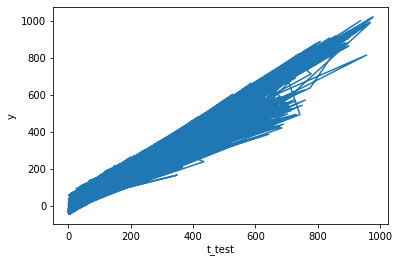

In [202]:
y = X_test@w
y
plt.plot(t_test,y)
plt.xlabel("t_test")
plt.ylabel("y")
plt.show()

In [203]:
X_test.shape
##10428

(10428, 12)

(10428, 12)

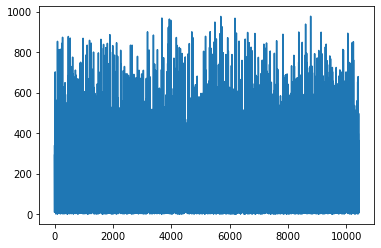

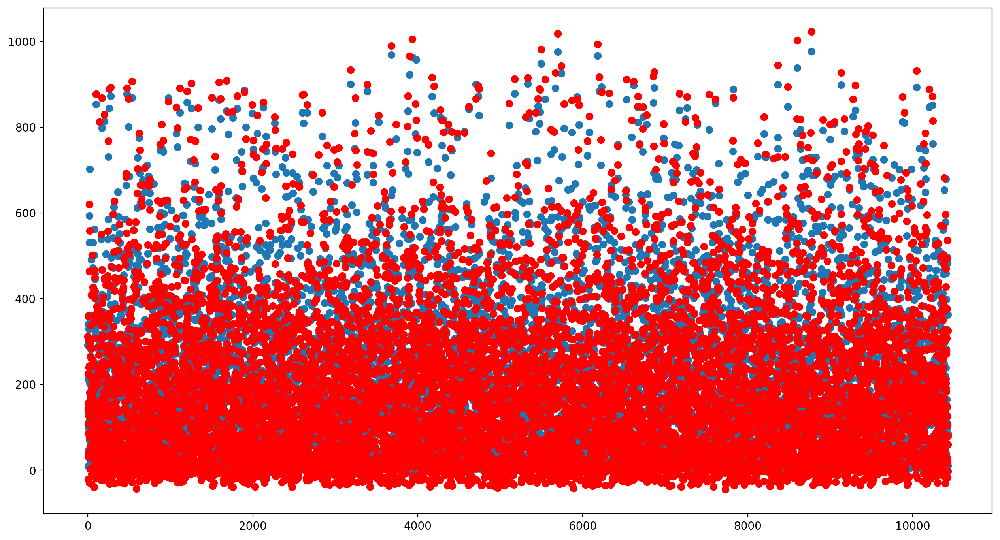

In [211]:
X_Cor = np.arange(0,10428,1)
plt.plot(X_Cor,t_test)
fig = plt.figure(figsize = (15,8),dpi = 200)
axes = fig.add_axes([1,0.1,0.8,0.8])
axes.scatter(X_Cor,t_test)
axes.scatter(X_Cor,y,color = "red")
X_test.shape

### MAP

[291   9 340 ...  86  83  10]


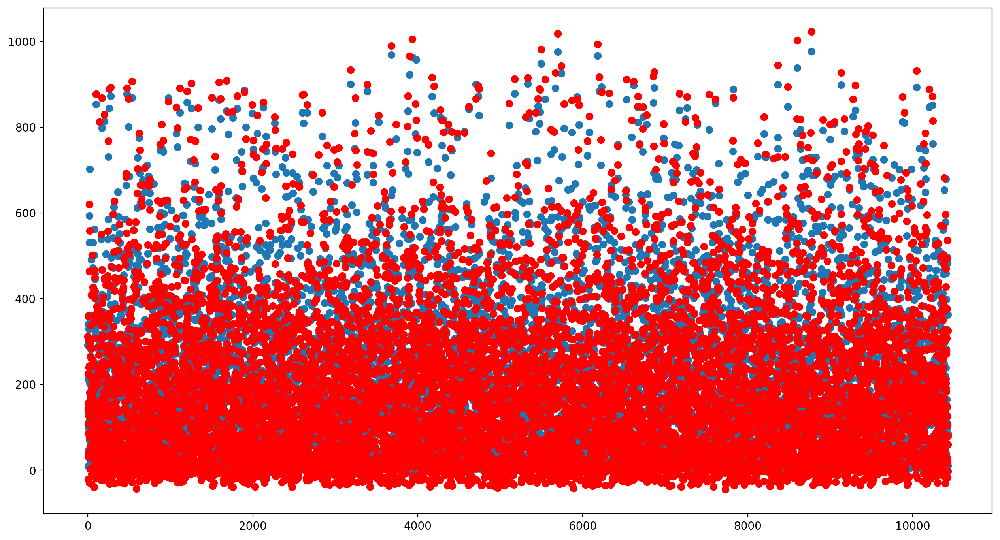

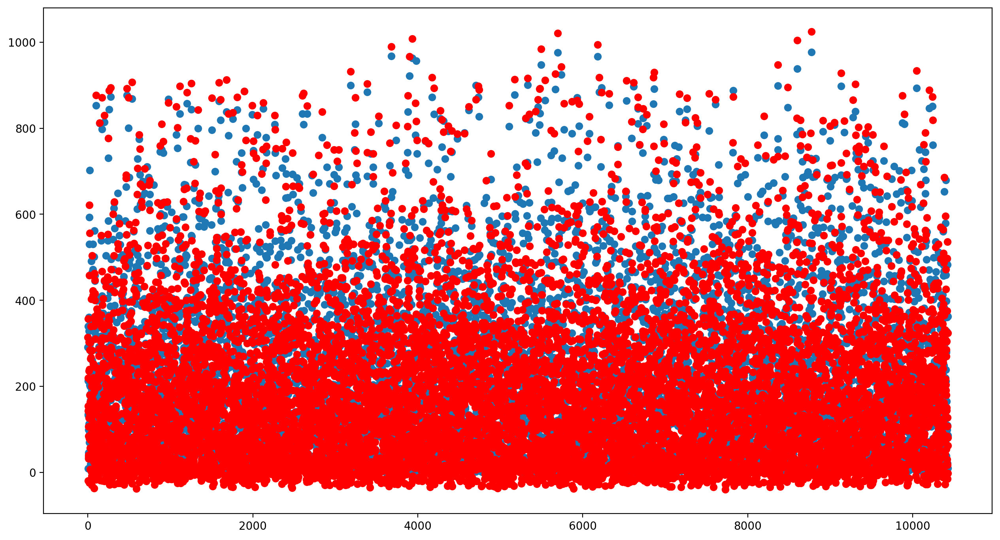

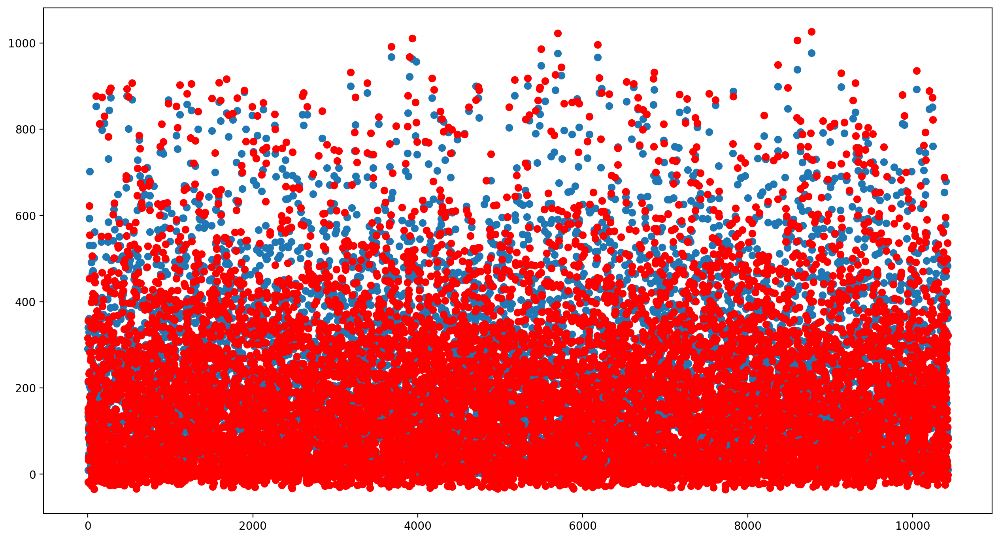

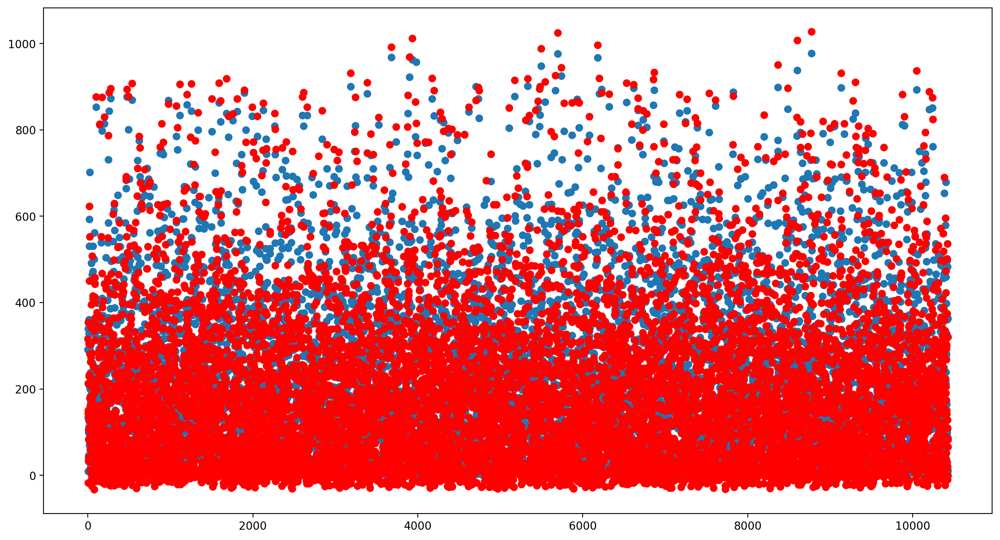

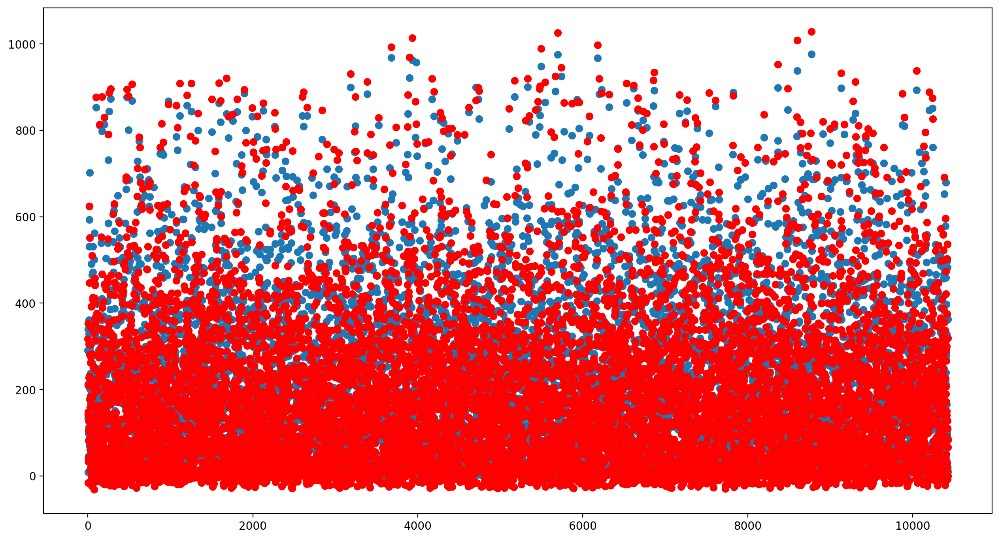

...

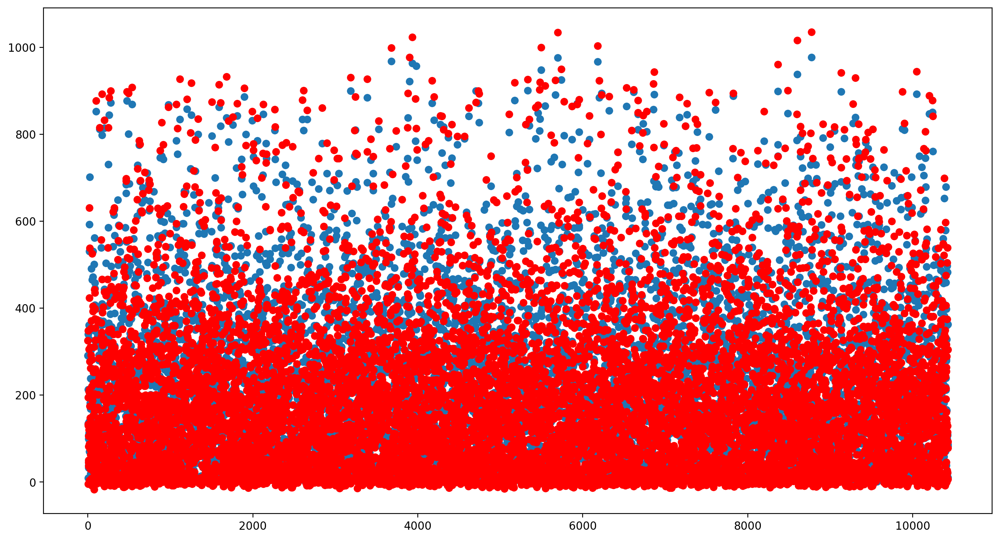

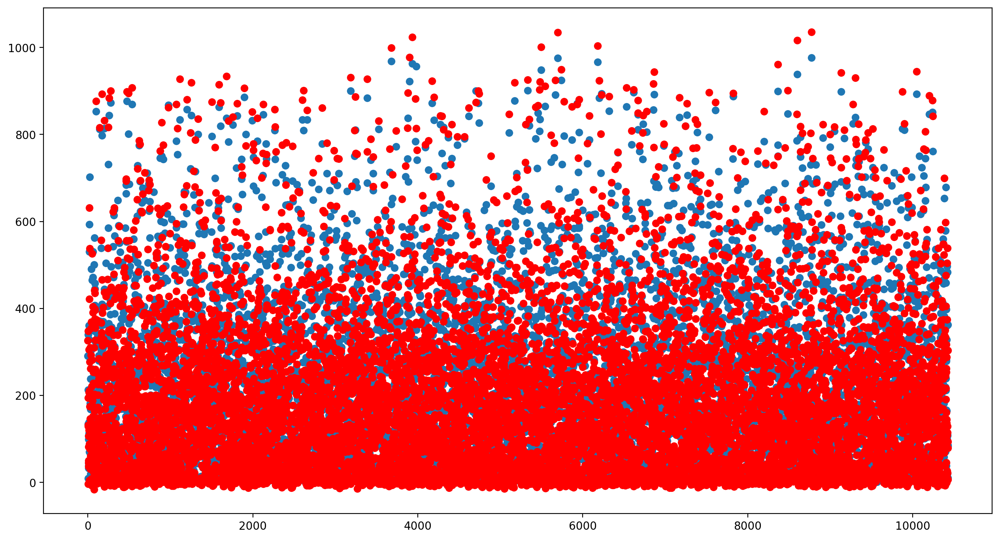

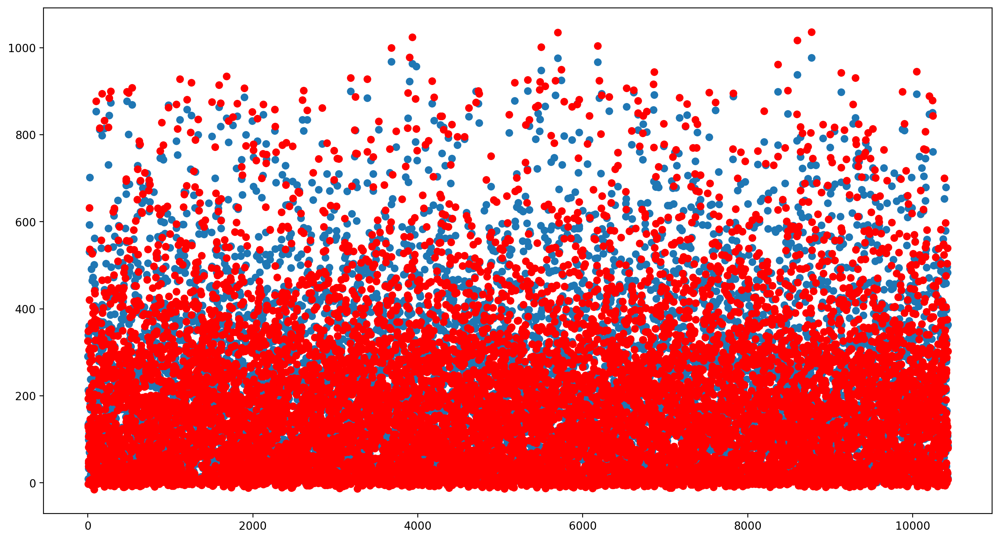

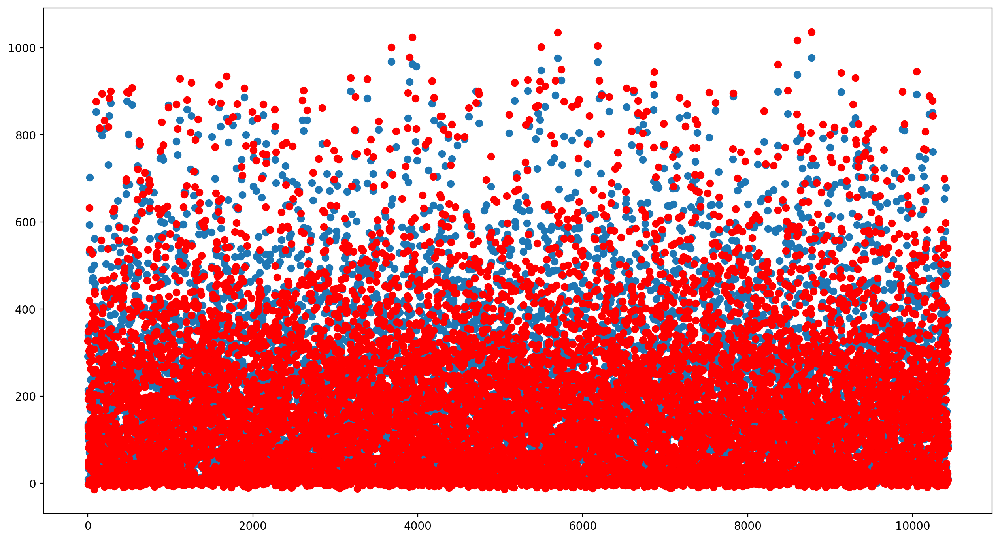

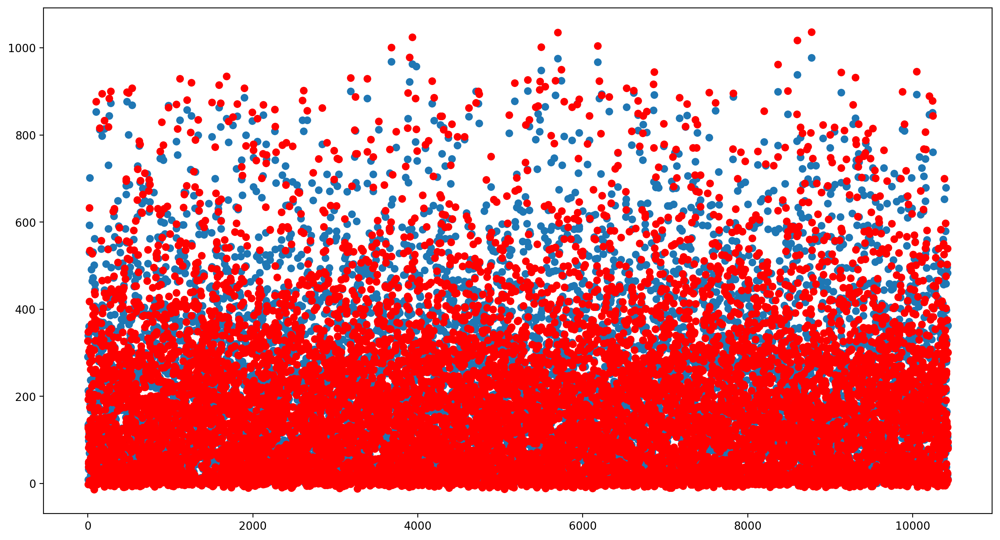

In [232]:
l = [0,50,100,150,200,250,300,350,550,750,800,1000,1200,1400,1600,1800,2000,2200]

print(t_test)
for i in l:
    w = list(np.linalg.inv(X_training.T@X_training+i*np.eye(12))@X_training.T@t_train)
    y=X_test@w
    X_Cor = np.arange(0,10428,1)
    fig = plt.figure(figsize = (15,8),dpi = 200)
    axes = fig.add_axes([1,0.1,0.8,0.8])
    axes.scatter(X_Cor,t_test)
    axes.scatter(X_Cor,y,color = "red")

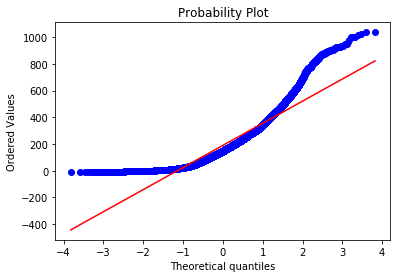

In [233]:
import numpy as np 
import pylab 
import scipy.stats as stats

y = np.array(y)
stats.probplot(y, dist="norm", plot=pylab)
pylab.show()